In [4]:
import os

In [5]:
dest_path="/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/india/uttar_pradesh/images"



source_path="/home/patel_zeel/kiln_compass_24/data/uttar_pradesh/images"




In [6]:
import os
import shutil
from pathlib import Path

# Define source and destination paths
source_path = Path("/home/patel_zeel/kiln_compass_24/data/uttar_pradesh/images")
dest_path = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/india/uttar_pradesh/images")

# Create destination directory if it doesn't exist
dest_path.mkdir(parents=True, exist_ok=True)

# Define allowed image extensions
image_extensions = {".jpg", ".jpeg", ".png", ".tif", ".tiff"}

# Iterate over all files in the source directory
for image_file in source_path.iterdir():
    if image_file.suffix.lower() in image_extensions:
        dest_link = dest_path / image_file.name
        try:
            if not dest_link.exists():
                os.symlink(image_file.resolve(), dest_link)
                print(f"Linked: {dest_link}")
            else:
                print(f"Skipped (already exists): {dest_link}")
        except Exception as e:
            print(f"Error linking {image_file.name}: {e}")


Linked: /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/india/uttar_pradesh/images/8756628_3166325.tif
Linked: /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/india/uttar_pradesh/images/8858442_3034241.tif
Linked: /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/india/uttar_pradesh/images/9007036_3240621.tif
Linked: /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/india/uttar_pradesh/images/8803407_3229614.tif
Linked: /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/india/uttar_pradesh/images/8610786_3356194.tif
Linked: /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/india/uttar_pradesh/images/9161133_2959945.tif
Linked: /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/india/uttar_pradesh/images/9051063_3259883.tif
Linked: /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/dat

In [5]:
import os
import shutil
from collections import defaultdict
from sklearn.model_selection import train_test_split

# === CONFIGURATION ===
LABEL_DIR = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/domain_adaptation_data/delhi_airshed/labels"
SPLIT_DIR = os.path.join(os.path.dirname(LABEL_DIR))  # /.../delhi_airshed/splits
OUTPUT_DIRS = {
    "train": os.path.join(SPLIT_DIR, "train/labels"),
    "val": os.path.join(SPLIT_DIR, "val/labels"),
    "test": os.path.join(SPLIT_DIR, "test/labels"),
}
NUM_CLASSES = 3  # You mentioned you have 3 classes

# === SETUP OUTPUT FOLDERS ===
for path in OUTPUT_DIRS.values():
    os.makedirs(path, exist_ok=True)

# === STEP 1: Organize label files by class ===
class_to_files = defaultdict(set)

for file in os.listdir(LABEL_DIR):
    if file.endswith(".txt"):
        file_path = os.path.join(LABEL_DIR, file)
        with open(file_path, 'r') as f:
            for line in f:
                class_id = int(line.strip().split()[0])
                class_to_files[class_id].add(file)

# === STEP 2: Perform safe stratified split per class ===
final_split = {"train": set(), "val": set(), "test": set()}

for cls, files in class_to_files.items():
    files = list(files)
    if len(files) < 2:
        print(f"⚠️ Not enough files to split for class {cls}. Assigning all to train.")
        final_split["train"].update(files)
    else:
        train_files, testval_files = train_test_split(files, train_size=0.5, random_state=42)
        
        if len(testval_files) < 2:
            val_files = testval_files[:1]
            test_files = testval_files[1:]
        else:
            val_files, test_files = train_test_split(testval_files, test_size=0.8, random_state=42)
        
        final_split["train"].update(train_files)
        final_split["val"].update(val_files)
        final_split["test"].update(test_files)

# === STEP 3: Copy files to their split folders ===
for split in ["train", "val", "test"]:
    for fname in final_split[split]:
        src = os.path.join(LABEL_DIR, fname)
        dst = os.path.join(OUTPUT_DIRS[split], fname)
        shutil.copy2(src, dst)

print("\n✅ Label files split and copied successfully!")

# === STEP 4: Count class instances per split ===
print("\n📊 Class-wise instance counts:")

for split in ["train", "val", "test"]:
    class_counts = defaultdict(int)
    label_path = OUTPUT_DIRS[split]
    
    for file in os.listdir(label_path):
        if file.endswith(".txt"):
            with open(os.path.join(label_path, file), 'r') as f:
                for line in f:
                    class_id = int(line.strip().split()[0])
                    class_counts[class_id] += 1

    print(f"\n🗂️ {split.upper()}:")
    for cid in range(NUM_CLASSES):
        print(f"  Class {cid}: {class_counts[cid]} instances")


⚠️ Not enough files to split for class 0. Assigning all to train.

✅ Label files split and copied successfully!

📊 Class-wise instance counts:

🗂️ TRAIN:
  Class 0: 1 instances
  Class 1: 27 instances
  Class 2: 443 instances

🗂️ VAL:
  Class 0: 0 instances
  Class 1: 7 instances
  Class 2: 53 instances

🗂️ TEST:
  Class 0: 0 instances
  Class 1: 22 instances
  Class 2: 338 instances


In [1]:
import os
import shutil
from collections import defaultdict
from sklearn.model_selection import train_test_split

# === CONFIGURATION ===
BASE_PATH = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/domain_adaptation_data/delhi_airshed"
LABEL_DIR = os.path.join(BASE_PATH, "labels")
IMAGE_DIR = os.path.join(BASE_PATH, "images")
SPLIT_DIR = os.path.join(BASE_PATH)
NUM_CLASSES = 3

# === Setup output dirs ===
SPLITS = ["train", "val", "test"]
OUTPUT_DIRS = {
    split: {
        "labels": os.path.join(SPLIT_DIR, split, "labels"),
        "images": os.path.join(SPLIT_DIR, split, "images"),
    }
    for split in SPLITS
}

for dirs in OUTPUT_DIRS.values():
    for path in dirs.values():
        os.makedirs(path, exist_ok=True)

# === Step 1: Class-wise label grouping ===
class_to_files = defaultdict(set)
all_label_files = set()

for file in os.listdir(LABEL_DIR):
    if file.endswith(".txt"):
        file_path = os.path.join(LABEL_DIR, file)
        all_label_files.add(file)
        with open(file_path, 'r') as f:
            for line in f:
                class_id = int(line.strip().split()[0])
                class_to_files[class_id].add(file)

# === Step 2: Stratified class-wise label splitting ===
final_split = {"train": set(), "val": set(), "test": set()}

for cls, files in class_to_files.items():
    files = list(files)
    if len(files) < 2:
        print(f"⚠️ Not enough files to split for class {cls}. Assigning all to train.")
        final_split["train"].update(files)
    else:
        train_files, testval_files = train_test_split(files, train_size=0.5, random_state=42)
        if len(testval_files) < 2:
            val_files = testval_files[:1]
            test_files = testval_files[1:]
        else:
            val_files, test_files = train_test_split(testval_files, test_size=0.8, random_state=42)

        final_split["train"].update(train_files)
        final_split["val"].update(val_files)
        final_split["test"].update(test_files)

# === Step 3: Copy labels to split folders ===
for split in SPLITS:
    for fname in final_split[split]:
        src = os.path.join(LABEL_DIR, fname)
        dst = os.path.join(OUTPUT_DIRS[split]["labels"], fname)
        shutil.copy2(src, dst)

# === Step 4: Symlink matched images ===
matched_image_files = set()
for split in SPLITS:
    label_files = final_split[split]
    for fname in label_files:
        basename = os.path.splitext(fname)[0]
        # Try common extensions
        for ext in [".jpg", ".jpeg", ".png", ".tif"]:
            img_path = os.path.join(IMAGE_DIR, basename + ext)
            if os.path.exists(img_path):
                dst_link = os.path.join(OUTPUT_DIRS[split]["images"], os.path.basename(img_path))
                if not os.path.exists(dst_link):
                    os.symlink(img_path, dst_link)
                matched_image_files.add(os.path.basename(img_path))
                break

# === Step 5: Distribute unmatched images ===
all_image_files = {
    f for f in os.listdir(IMAGE_DIR)
    if f.lower().endswith((".jpg", ".jpeg", ".png", ".tif"))
}
unmatched_images = list(all_image_files - matched_image_files)

# Randomly shuffle and split
train_unmatched, testval = train_test_split(unmatched_images, train_size=0.5, random_state=42)
val_unmatched, test_unmatched = train_test_split(testval, test_size=0.8, random_state=42)

unmatched_split = {
    "train": train_unmatched,
    "val": val_unmatched,
    "test": test_unmatched,
}

for split in SPLITS:
    for fname in unmatched_split[split]:
        src = os.path.join(IMAGE_DIR, fname)
        dst = os.path.join(OUTPUT_DIRS[split]["images"], fname)
        if not os.path.exists(dst):
            os.symlink(src, dst)

print("\n✅ Done: Labels copied and images symlinked with unmatched images split.")

# === Step 6: Optional — class-wise instance count per split ===
print("\n📊 Class-wise label instance counts:")
for split in SPLITS:
    class_counts = defaultdict(int)
    for file in os.listdir(OUTPUT_DIRS[split]["labels"]):
        with open(os.path.join(OUTPUT_DIRS[split]["labels"], file)) as f:
            for line in f:
                cls_id = int(line.strip().split()[0])
                class_counts[cls_id] += 1
    print(f"\n🗂️ {split.upper()}:")
    for cid in range(NUM_CLASSES):
        print(f"  Class {cid}: {class_counts[cid]} instances")


⚠️ Not enough files to split for class 0. Assigning all to train.

✅ Done: Labels copied and images symlinked with unmatched images split.

📊 Class-wise label instance counts:

🗂️ TRAIN:
  Class 0: 1 instances
  Class 1: 29 instances
  Class 2: 488 instances

🗂️ VAL:
  Class 0: 1 instances
  Class 1: 10 instances
  Class 2: 73 instances

🗂️ TEST:
  Class 0: 0 instances
  Class 1: 23 instances
  Class 2: 331 instances


In [2]:
import os

BASE_PATH = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/domain_adaptation_data/delhi_airshed"
SPLIT_PATH = os.path.join(BASE_PATH)
IMAGE_DIR = os.path.join(BASE_PATH, "images")
SPLITS = ["train", "val", "test"]

# Collect all original images
original_images = {
    f for f in os.listdir(IMAGE_DIR)
    if f.lower().endswith((".jpg", ".jpeg", ".png", ".tif"))
}

# Initialize containers
all_split_images = set()
all_split_labels = set()
missing_images = []
broken_symlinks = []
duplicate_images = False
duplicate_labels = False

print("\n🔎 Verifying splits...\n")

for split in SPLITS:
    split_label_dir = os.path.join(SPLIT_PATH, split, "labels")
    split_image_dir = os.path.join(SPLIT_PATH, split, "images")

    split_labels = set(os.listdir(split_label_dir))
    split_images = set(os.listdir(split_image_dir))

    # Check for duplicate labels
    common_labels = all_split_labels & split_labels
    if common_labels:
        duplicate_labels = True
        print(f"❌ Duplicate label files in {split}: {common_labels}")
    all_split_labels.update(split_labels)

    # Check for duplicate images
    common_images = all_split_images & split_images
    if common_images:
        duplicate_images = True
        print(f"❌ Duplicate image files in {split}: {common_images}")
    all_split_images.update(split_images)

    for label in split_labels:
        image_found = False
        base = os.path.splitext(label)[0]
        for ext in [".jpg", ".jpeg", ".png", ".tif"]:
            image_path = os.path.join(split_image_dir, base + ext)
            if os.path.exists(image_path):
                image_found = True
                # Check if symlink is valid
                if os.path.islink(image_path) and not os.path.exists(os.readlink(image_path)):
                    broken_symlinks.append(image_path)
                break
        if not image_found:
            missing_images.append(label)

print("\n🧾 Summary Report:")
print(f"🔹 Total original images          : {len(original_images)}")
print(f"🔹 Total split images (symlinks)  : {len(all_split_images)}")
print(f"🔹 Total split labels             : {len(all_split_labels)}")
print(f"🔹 Missing images for labels      : {len(missing_images)}")
print(f"🔹 Broken image symlinks          : {len(broken_symlinks)}")
print(f"🔹 Duplicate image files across splits: {'Yes' if duplicate_images else 'No'}")
print(f"🔹 Duplicate label files across splits: {'Yes' if duplicate_labels else 'No'}")

# Detail lists if any issues found
if missing_images:
    print("\n❌ Labels with no corresponding image:")
    for f in missing_images:
        print(" -", f)

if broken_symlinks:
    print("\n❌ Broken image symlinks:")
    for f in broken_symlinks:
        print(" -", f)

if not (missing_images or broken_symlinks or duplicate_images or duplicate_labels):
    print("\n✅ All checks passed! Your split is clean and correct.")



🔎 Verifying splits...

❌ Duplicate label files in val: {'8621487_3358946.txt', '8640749_3281897.txt', '8618735_3356194.txt'}
❌ Duplicate image files in val: {'8621487_3358946.tif', '8640749_3281897.tif', '8618735_3356194.tif'}
❌ Duplicate label files in test: {'8635246_3292904.txt', '8637998_3292904.txt', '8610480_3345187.txt', '8618735_3342435.txt', '8637998_3303911.txt', '8615984_3284649.txt', '8563701_3339684.txt', '8621487_3347939.txt', '8637998_3347939.txt', '8624239_3350691.txt', '8613232_3350691.txt', '8621487_3342435.txt', '8618735_3276394.txt', '8618735_3279146.txt'}
❌ Duplicate image files in test: {'8637998_3347939.tif', '8618735_3279146.tif', '8613232_3350691.tif', '8637998_3292904.tif', '8621487_3347939.tif', '8621487_3342435.tif', '8618735_3342435.tif', '8618735_3276394.tif', '8610480_3345187.tif', '8635246_3292904.tif', '8624239_3350691.tif', '8637998_3303911.tif', '8563701_3339684.tif', '8615984_3284649.tif'}

🧾 Summary Report:
🔹 Total original images          : 1116
🔹


🔍 Processing split: TRAIN


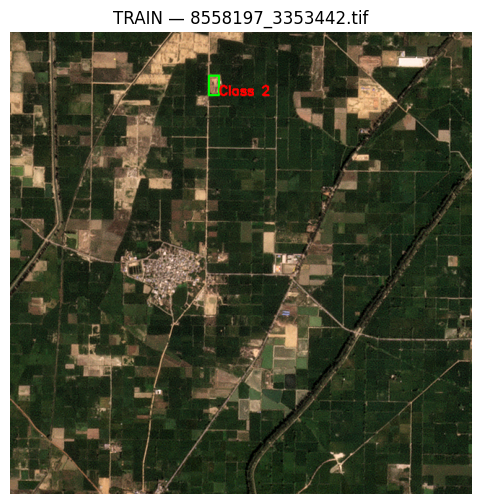

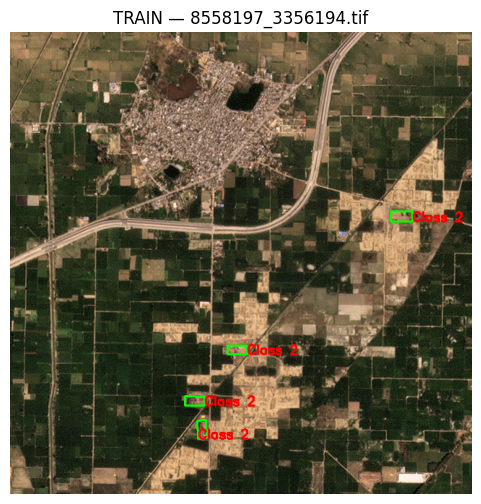

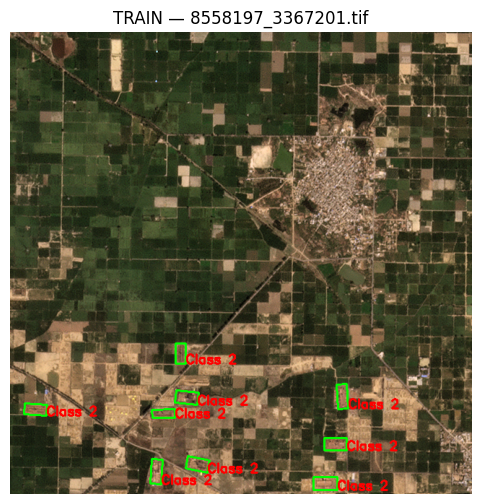

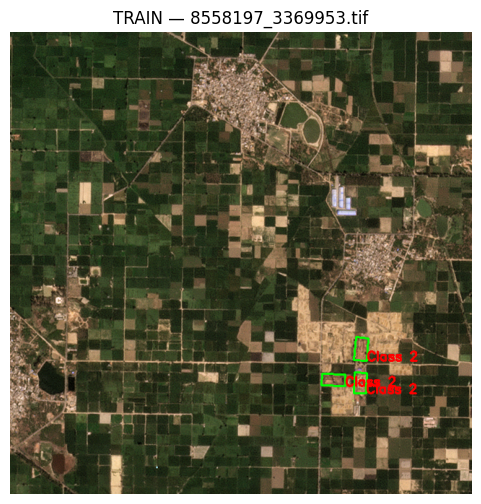

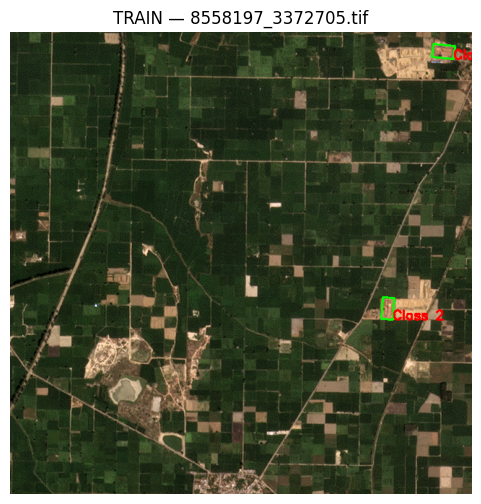


🔍 Processing split: VAL


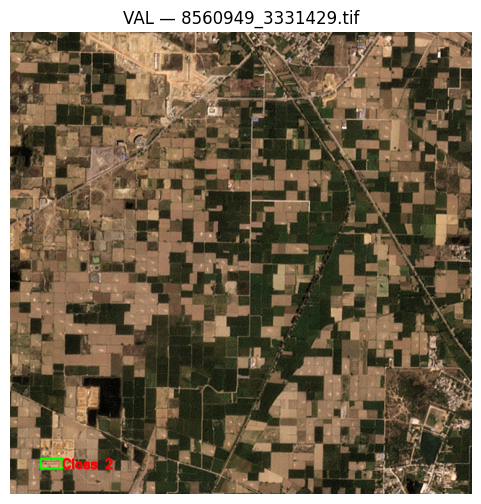

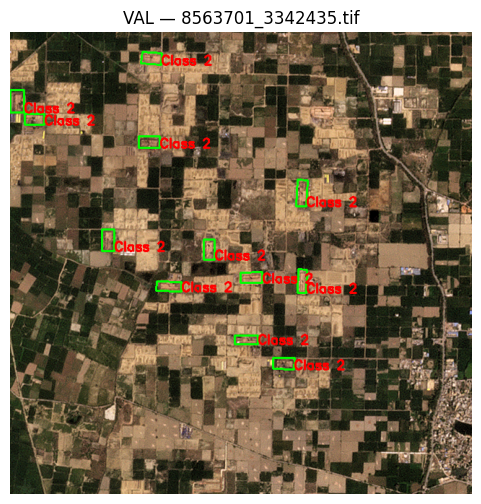

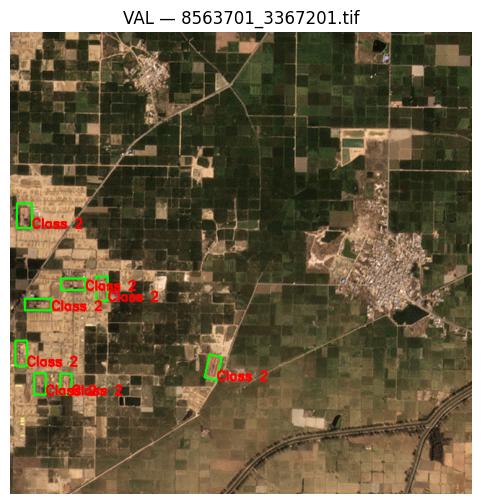

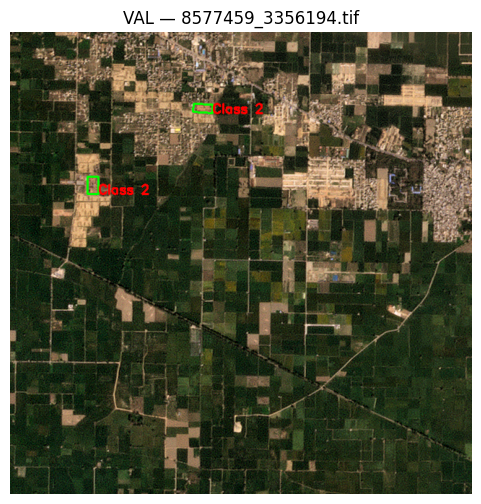

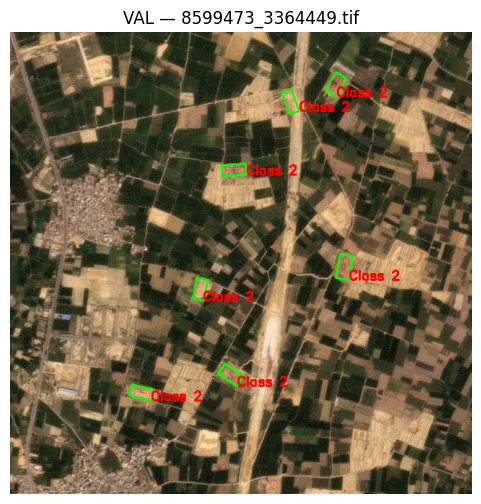


🔍 Processing split: TEST


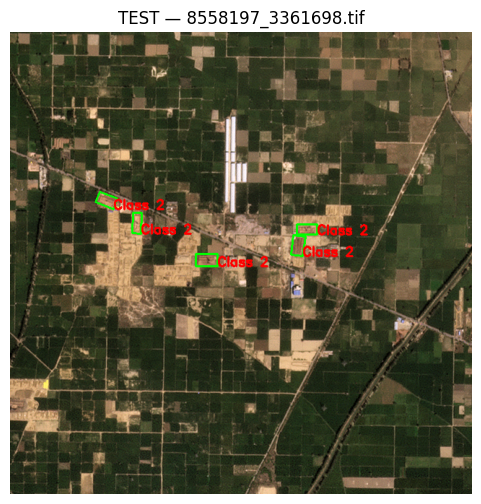

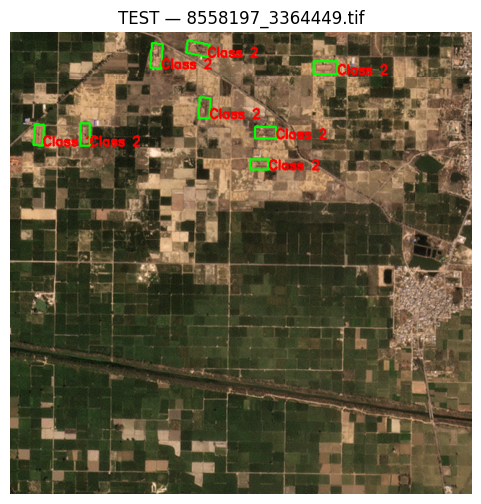

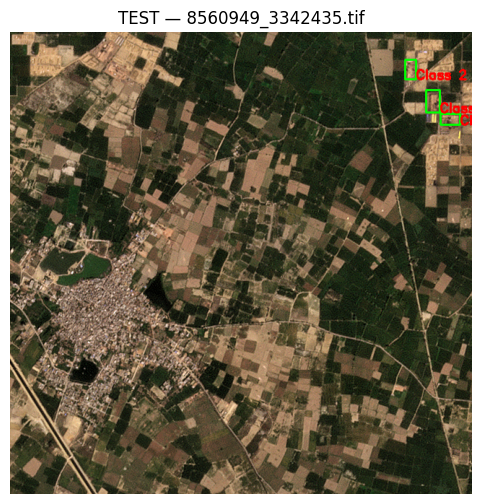

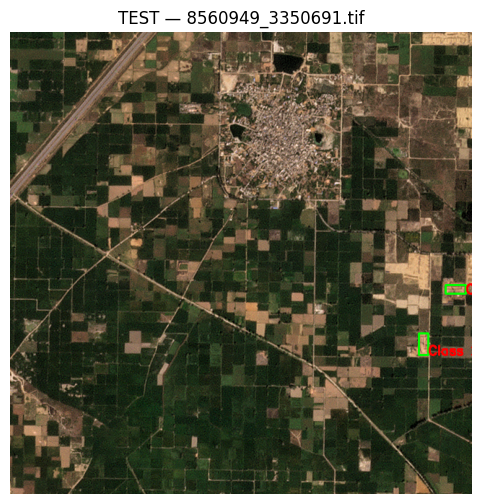

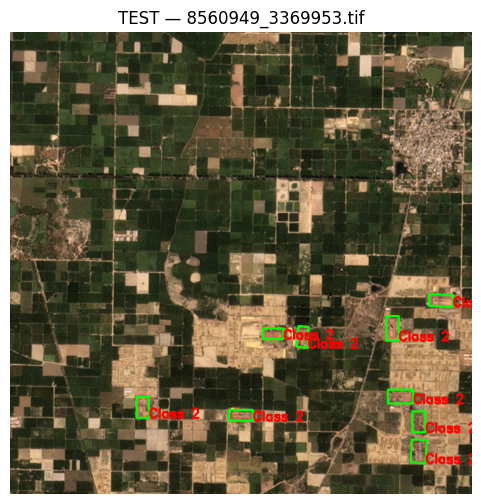

In [5]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# CONFIGURATION
BASE_PATH = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/domain_adaptation_data/delhi_airshed"
SPLITS = ["train", "val", "test"]
IMAGE_SIZE = 640  # target size

def draw_obb(image, label_path):
    with open(label_path, 'r') as f:
        lines = f.readlines()

    for line in lines:
        parts = list(map(float, line.strip().split()))
        cls = int(parts[0])
        coords = parts[1:]
        points = [(coords[i]*IMAGE_SIZE, coords[i+1]*IMAGE_SIZE) for i in range(0, len(coords), 2)]
        points = np.array(points, dtype=np.int32).reshape((-1, 1, 2))

        cv2.polylines(image, [points], isClosed=True, color=(0, 255, 0), thickness=2)
        cv2.putText(image, f"Class {cls}", tuple(points[0][0]), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)

    return image

for split in SPLITS:
    print(f"\n🔍 Processing split: {split.upper()}")
    image_dir = os.path.join(BASE_PATH, split, "images")
    label_dir = os.path.join(BASE_PATH, split, "labels")

    image_files = sorted([
        f for f in os.listdir(image_dir)
        if f.lower().endswith((".jpg", ".jpeg", ".png", ".tif"))
    ])

    matched = []
    for img_file in image_files:
        label_file = os.path.splitext(img_file)[0] + ".txt"
        if os.path.exists(os.path.join(label_dir, label_file)):
            matched.append((img_file, label_file))
        if len(matched) == 5:
            break

    for img_file, label_file in matched:
        img_path = os.path.join(image_dir, img_file)
        label_path = os.path.join(label_dir, label_file)

        image = cv2.imread(img_path)
        if image is None:
            print(f"⚠️ Failed to load image: {img_path}")
            continue

        image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
        image = draw_obb(image, label_path)

        plt.figure(figsize=(6, 6))
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f"{split.upper()} — {img_file}")
        plt.axis("off")
        plt.show()
